In [5]:
import numpy as np
import pandas as pd

In [6]:
df=pd.read_csv(r'/content/drive/MyDrive/Restaurant_clustering_project/menu_items.csv')

In [7]:
df.head()

,restaurant,section,item,description,price
0,bel aire restaurant diner,cocktails must be 0 to purchase,mixed cocktail must be 0 to purchase,must be 0 to purchase choice of liquor and mix...,$7.99
1,bel aire restaurant diner,cocktails must be 0 to purchase,shots shots shots must be 0 to purchase,must be 0 to purchase choice of jose cuervo ja...,$3.99
2,bel aire restaurant diner,cocktails must be 0 to purchase,0 oz wine cup must be 0 to purchase,must be 0 to purchase specify chardonnay red b...,$5.99
3,bel aire restaurant diner,cocktails must be 0 to purchase,0 oz absolut lemonade must be 0 to purchase,must be 0 to purchase classic lemonade with a ...,$4.99
4,bel aire restaurant diner,cocktails must be 0 to purchase,0 oz peach sour must be 0 to purchase,must be 0 to purchase bushmill s whiskey muddl...,$7.99


In [8]:
df = df.dropna(subset=['restaurant', 'item'])

In [10]:
df['restaurant'].value_counts()

china garden                    4262
china wok                       3884
pick up stix                    3300
china house                     2870
china king                      2841
                                ... 
chocolate secrets                  1
natraj a la carte quail hill       1
churros el guero                   1
sgd tofu house                     1
commonwealth restaurant            1
Name: restaurant, Length: 14095, dtype: int64

In [ ]:
import pandas as pd
from nltk.corpus import stopwords
import re
import nltk

# If you haven't downloaded the stopwords from NLTK, do so
nltk.download('stopwords')

# Create list of stopwords for the four languages
stop_words = stopwords.words('english') + stopwords.words('french') + stopwords.words('italian') + stopwords.words('spanish')

# Define a function that cleans the text
def clean_text(text):
    text = str(text)  # Convert text to string
    text = re.sub(r'\d+', '', text)  # Remove numbers
    text = re.sub(r'[^\w\s]', '', text)  # Remove punctuation
    text = text.lower()  # Convert to lowercase
    text = ' '.join(word for word in text.split() if word not in stop_words)  # Remove stopwords
    return text

# Apply the function to the 'item' and 'description' columns
df['item'] = df['item'].apply(clean_text)
df['description'] = df['description'].apply(clean_text)


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [ ]:
#to clean where both food item repeats for one particular restaurant
df = df.drop_duplicates(subset=['restaurant', 'item'])

df.head()

,restaurant,section,item,description,price
0,bel aire restaurant diner,cocktails must be 0 to purchase,mixed cocktail must purchase,must purchase choice liquor mixer must purchase,$7.99
1,bel aire restaurant diner,cocktails must be 0 to purchase,shots shots shots must purchase,must purchase choice jose cuervo jameson absol...,$3.99
2,bel aire restaurant diner,cocktails must be 0 to purchase,oz wine cup must purchase,must purchase specify chardonnay red blend cab...,$5.99
3,bel aire restaurant diner,cocktails must be 0 to purchase,oz absolut lemonade must purchase,must purchase classic lemonade shot absolut mu...,$4.99
4,bel aire restaurant diner,cocktails must be 0 to purchase,oz peach sour must purchase,must purchase bushmill whiskey muddled peach p...,$7.99


In [ ]:
df.duplicated(subset=['restaurant', 'item']).sum()

0

In [ ]:
#want to keep only the restros which offer variety of food items , so 30 is optimal values considering appetizers, maincourse and desssert ,10 form each.
df = df.groupby('restaurant').filter(lambda x: len(x) > 30)
df['restaurant'].value_counts()

china wok                                2455
china garden                             2370
harvard market                           2054
china house                              1862
china king                               1711
                                         ... 
potato club                                31
wildwich                                   31
sabroso burrito                            31
bamboo tropical                            31
mama fu s asian house round rock ikea      31
Name: restaurant, Length: 12758, dtype: int64

In [ ]:
df = df.groupby('item').filter(lambda x: len(x) > 1)
df['item'].value_counts()

soda                    4313
french fries            3969
caesar salad            3308
greek salad             2867
bottled water           2561
                        ... 
ucla bruins sandwich       2
usc trojan sandwich        2
air force lou              2
airport bergmann           2
pepper garlic entree       2
Name: item, Length: 114174, dtype: int64

In [ ]:
mask = df['item'].str.contains('shots', case=False, na=False)

# Use the mask to filter the DataFrame
df_mask = df[mask]
df_mask

,restaurant,section,item,description,price
363863,paisan s old world deli catering,specialty coffee drinks,espresso shots,nan,$2.00
366641,stephen s cafe,beverages,espresso shots,nan,$3.25
561382,wendi s donuts,coffee,espresso shots,nan,$1.95
1729004,biscotts,coffee drinks,espresso shots,espresso shots,$2.50


In [ ]:
def concatenate_columns(row):
    if pd.isnull(row['description']):
        return row['item']
    else:
        item_words = row['item'].lower().split()
        description_words = row['description'].lower().split()
        matched_segments = []
        for i, word in enumerate(description_words):
            if word in item_words:
                prev_word = description_words[i - 1] if i > 0 else ""
                next_word = description_words[i + 1] if i < len(description_words) - 1 else ""
                matched_segments.append(" ".join([prev_word, word, next_word]))
        return row['item'] if not matched_segments else ", ".join(matched_segments)

df['item_desc'] = df.apply(concatenate_columns, axis=1)

In [ ]:
df['restaurant'].nunique()

12755

In [ ]:
import nltk
from nltk.stem import *
nltk.download('punkt') # For Stemming
nltk.download('wordnet') # For Lemmatization
nltk.download('stopwords') # For Stopword Removal
nltk.download('omw-1.4')

#Preprocess the tweets and returns a corpus(list of lists)
stop_words = set(stopwords.words('english'))
def text_preprocessing(df):
    corpus=[]

    lem = WordNetLemmatizer() # For Lemmatization
    for i in df['item_desc']:
        words=[w for w in nltk.tokenize.word_tokenize(i) if (w not in stop_words)] # word_tokenize function tokenizes text on each word by default
        words=[lem.lemmatize(w) for w in words if len(w)>2]
        corpus.append(words)
    return corpus

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


In [ ]:
corpus=text_preprocessing(df)
print(f"length of corpus : {len(corpus)}\n type of corpus :{type(corpus)}")

length of corpus : 1190793
 type of corpus :<class 'list'>


In [ ]:
df['item_desc_processed']=corpus

In [ ]:
from gensim.models import word2vec
from gensim.models import FastText

w2v_model = word2vec.Word2Vec(min_count=1,
                     window=5,
                     vector_size=100,
                     workers=4,
                    #  sg=1,
                     )

w2v_model.build_vocab(corpus, progress_per=10000)
w2v_model.train(corpus,
                total_examples=w2v_model.corpus_count,
                epochs=20, report_delay=1)


(51546517, 68133340)

In [ ]:
(w2v_model.wv.__getitem__(['burrito']))

array([[ 1.1808314 , -0.31528628, -1.1678641 , -1.4752446 ,  0.9918971 ,
         0.7808969 ,  1.2965554 , -1.0572704 ,  0.18777148,  1.2006891 ,
        -0.30051118,  1.6831644 , -2.0087652 , -0.8241972 , -0.24265091,
         0.75362605,  0.16173665, -0.01826054,  1.2512197 ,  0.7177903 ,
        -0.07691889,  0.29622525, -3.543929  , -1.2315114 ,  1.4378824 ,
         0.43063027, -1.0584323 ,  0.3301956 ,  2.5527387 ,  0.5288704 ,
         0.18343334, -1.8275299 ,  0.16919531,  0.5018495 ,  0.37239546,
         0.3845321 ,  1.4557209 , -0.46888137,  0.7384436 ,  1.3112459 ,
         0.40452582,  0.3470411 , -2.4660306 , -1.0184544 ,  0.32990906,
         0.04992266, -0.06886708,  0.7573167 ,  0.22769788,  0.62731296,
        -1.6093633 , -2.131155  , -0.06783976,  2.0739582 , -1.1052867 ,
         1.8861434 ,  0.81247264, -2.349982  ,  1.6540267 ,  0.55270404,
         2.3227253 ,  0.19390166,  0.9142948 ,  0.3801866 , -0.13524249,
        -0.31861803, -0.39016223, -0.8859693 ,  0.9

In [ ]:
from matplotlib import pyplot as plt
import bokeh.plotting as bp
from bokeh.models import HoverTool, BoxSelectTool
from bokeh.models import ColumnDataSource
from bokeh.plotting import figure, show, output_notebook

In [ ]:
import seaborn as sns
sns.set_style("darkgrid")

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE


def tsnescatterplot(model, word, list_names):
    """ Plot in seaborn the results from the t-SNE dimensionality reduction algorithm of the vectors of a query word,
    its list of most similar words, and a list of words.
    """
    arrays = np.empty((0, 100), dtype='f')
    word_labels = [word]
    color_list  = ['red']

    # adds the vector of the query word
    arrays = np.append(arrays, model.wv.__getitem__([word]), axis=0)

    # gets list of most similar words
    close_words = model.wv.most_similar([word])

    # adds the vector for each of the closest words to the array
    for wrd_score in close_words:
        wrd_vector = model.wv.__getitem__([wrd_score[0]])
        word_labels.append(wrd_score[0])
        color_list.append('blue')
        arrays = np.append(arrays, wrd_vector, axis=0)

    # adds the vector for each of the words from list_names to the array
    for wrd in list_names:
        wrd_vector = model.wv.__getitem__([wrd])
        word_labels.append(wrd)
        color_list.append('green')
        arrays = np.append(arrays, wrd_vector, axis=0)

    # Reduces the dimensionality from 100 to 50 dimensions with PCA
    reduc = PCA(n_components=12).fit_transform(arrays)

    # Finds t-SNE coordinates for 2 dimensions
    np.set_printoptions(suppress=True)

    Y = TSNE(n_components=2, random_state=0, perplexity=10).fit_transform(reduc)

    # Sets everything up to plot
    df = pd.DataFrame({'x': [x for x in Y[:, 0]],
                       'y': [y for y in Y[:, 1]],
                       'words': word_labels,
                       'color': color_list})
    fig, _ = plt.subplots()
    fig.set_size_inches(9, 9)

    # Basic plot
    p1 = sns.regplot(data=df,
                     x="x",
                     y="y",
                     fit_reg=False,
                     marker="o",
                     scatter_kws={'s': 40,
                                  'facecolors': df['color']
                                 }
                    )

    # Adds annotations one by one with a loop
    for line in range(0, df.shape[0]):
         p1.text(df["x"][line],
                 df['y'][line],
                 '  ' + df["words"][line].title(),
                 horizontalalignment='left',
                 verticalalignment='bottom', size='medium',
                 color=df['color'][line],
                 weight='normal'
                ).set_size(15)

    plt.xlim(Y[:, 0].min()-50, Y[:, 0].max()+50)
    plt.ylim(Y[:, 1].min()-50, Y[:, 1].max()+50)

    plt.title('t-SNE visualization for {}'.format(word.title()))

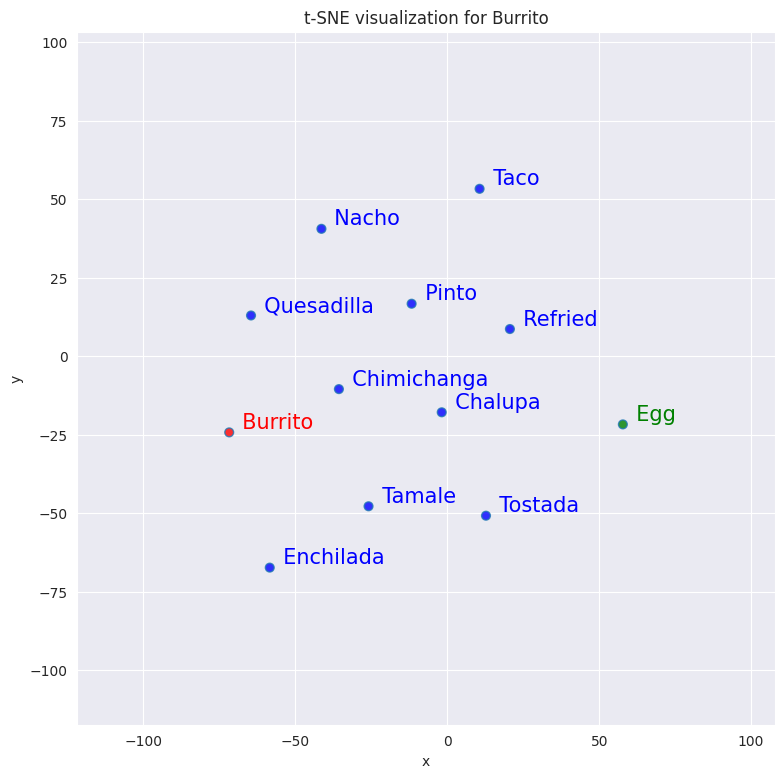

In [ ]:
tsnescatterplot(w2v_model, 'burrito',['egg'])

In [ ]:
def average_word_embedding(word_list, model):
    # Get embeddings for all words in the list
    embeddings = [model.wv[word] for word in word_list if word in model.wv.key_to_index]

    # Average the embeddings
    avg_embedding = np.mean(embeddings, axis=0)

    return avg_embedding

# Assuming df is your DataFrame and word2vec_model is your trained Word2Vec model
df['item_desc_embd'] = df['item_desc_processed'].apply(lambda x: average_word_embedding(x, w2v_model))


/usr/local/lib/python3.10/dist-packages/numpy/core/fromnumeric.py:3474: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,


In [ ]:
# Remove the dollar sign and convert to float
df['price'] = df['price'].str.replace('$', '').astype(float)

<ipython-input-28-86fa021db119>:2: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.
  df['price'] = df['price'].str.replace('$', '').astype(float)


In [ ]:
def document_vector(word2vec_model, doc):
    # remove out-of-vocabulary words
    doc = [word for word in doc if word in word2vec_model.wv.key_to_index]
    if len(doc) == 0:
        return np.zeros(word2vec_model.vector_size)
    else:
        return np.mean(word2vec_model.wv[doc], axis=0)

# use `item_desc_processed` column from your DataFrame
embeddings_array = np.array([document_vector(w2v_model, doc) for doc in df['item_desc_processed']])

In [ ]:
# from sklearn.cluster import KMeans

# # List to hold the WCSS for each number of clusters
# wcss = []

# # We'll compute WCSS for 1-10 clusters (change this range to suit your needs)
# for i in range(1,31):
#     kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=30, random_state=0)
#     kmeans.fit(combined_features) # replace 'your_data' with your actual DataFrame
#     wcss.append(kmeans.inertia_)

# # Plot the Elbow Method graph
# plt.plot(range(1,31), wcss)
# plt.title('Elbow Method')
# plt.xlabel('Number of clusters')
# plt.ylabel('WCSS')
# plt.show()

NameError: ignored

In [ ]:
df.head()

In [ ]:
df.reset_index(drop=True, inplace=True)

In [ ]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)

pca_combined_features = pca.fit_transform(embeddings_array)
print(pca_combined_features.shape)


In [ ]:
#creating the dataframe with words and it 2 dimensional vector embeddings
cluster_df=pd.DataFrame(pca_combined_features,columns=['x','y'])
cluster_df['item']=df['item_desc']
cluster_df['restaurant']=df['restaurant']
cluster_df['price']=df['price']
cluster_df

In [ ]:
output_notebook()
plot_tfidf = bp.figure(outer_width=700, outer_height=600,
                       title="w2v clustering of the items",
    tools="pan,wheel_zoom,box_zoom,reset,hover,save",
    x_axis_type=None, y_axis_type=None, min_border=1)

cluster_df = cluster_df.sample(n=50000)
plot_tfidf.scatter(x='x', y='y', source=cluster_df, alpha=0.7,)
hover = plot_tfidf.select(dict(type=HoverTool))
hover.tooltips={"item": "@item","restaurant" : "@restaurant","price":"@price"}
show(plot_tfidf)

Loading BokehJS ...

In [ ]:
from sklearn.decomposition import PCA

pca = PCA(n_components=4)

pca_combined_features = pca.fit_transform(embeddings_array)
print(pca_combined_features.shape)


(1190793, 4)


In [ ]:
#creating the minibatch clustering model
from sklearn.cluster import MiniBatchKMeans
np.random.seed(0)
num_clusters = 6 # need to be selected wisely
kmeans_model = MiniBatchKMeans(n_clusters=num_clusters,
                               init='k-means++',
                               random_state=21,
                               n_init=25,
                               init_size=1000, batch_size=1000, verbose=0, max_iter=1000)
colormap = np.array(["#6d8dca", "#69de53", "#723bca", "#c3e14c","#FF1493","#FF6347", "#00CED1", "#FF8C00", "#3CB371", "#BA55D3","#f3920f", "#00FFFF", "#FFD700", "#006400", "#800080"])

In [ ]:
kmeans = kmeans_model.fit(pca_combined_features)
kmeans_clusters = kmeans.predict(pca_combined_features)
kmeans_distances = kmeans.transform(pca_combined_features)

pca = PCA(n_components=2)
pca_kmeans=pca.fit_transform(kmeans_distances)
kmeans_df = pd.DataFrame(pca_kmeans, columns=['x', 'y'])
kmeans_df['cluster'] = kmeans_clusters
kmeans_df['item']=df['item_desc']
kmeans_df['restaurant']=df['restaurant']
kmeans_df['price']=df['price']

In [ ]:
kmeans_df = kmeans_df.sample(n=110000)
plot_kmeans = bp.figure(outer_width=700, outer_height=600,
                        title="KMeans clustering of the Items",
    tools="pan,wheel_zoom,box_zoom,reset,hover,save",
    x_axis_type=None, y_axis_type=None, min_border=1)
source = ColumnDataSource(data=dict(x=kmeans_df['x'], y=kmeans_df['y'],
                                    color=colormap[kmeans_df['cluster']],
                                    item=kmeans_df['item'],
                                    restaurant=kmeans_df['restaurant'],
                                    price=kmeans_df['price']))

plot_kmeans.scatter(x='x', y='y', color='color', source=source)
hover = plot_kmeans.select(dict(type=HoverTool))
hover.tooltips={"item": "@item","restaurant" : "@restaurant","price":"@price"}
show(plot_kmeans)

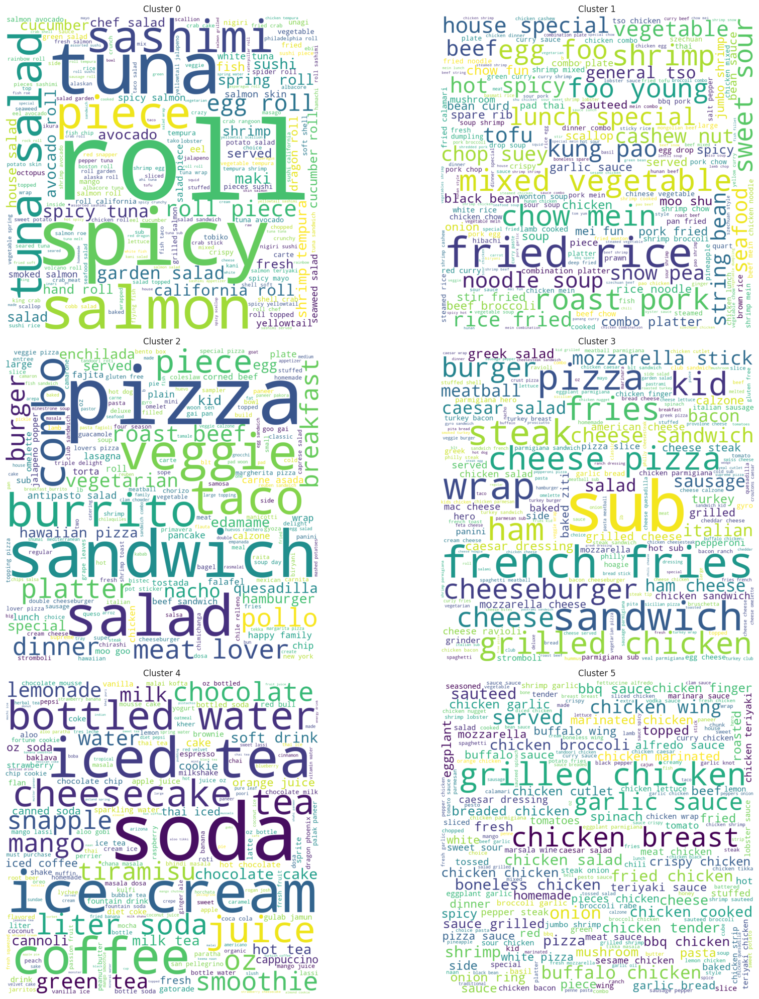

In [ ]:
from collections import Counter

from wordcloud import WordCloud
import matplotlib.pyplot as plt

fig, axs = plt.subplots(3, 2, figsize=(20, 20))

for i in range(6):
    wc = WordCloud(width=1000, height=1000, min_font_size=10, background_color='white')
    cl = wc.generate(kmeans_df[kmeans_df['cluster'] == i]['item'].str.cat(sep=' '))

    row = i // 2
    col = i % 2

    axs[row, col].imshow(cl, interpolation='bilinear')
    axs[row, col].axis('off')
    axs[row, col].set_title(f'Cluster {i}')

plt.tight_layout()
plt.show()

In [ ]:
kmeans_df.head()

,x,y,cluster,item,restaurant,price,price_category
0,-3.343751,4.102822,2,tsingtao,dragon s pond,4.50,low
1,-1.655287,1.416145,2,super taco sandwich combo,big city grill lemonade,12.99,high
2,-3.578228,1.500727,2,spices sub roll,the wing factory,6.95,medium
3,-0.418808,4.904289,4,aloo mutter,samudra restaurant,9.99,medium
4,-0.808217,-4.390119,5,marinated chicken served,am thai fusion cuisine,11.95,high


In [ ]:
kmeans_df.reset_index(drop=True,inplace=True)

In [ ]:
def print_top10_items_in_price_categories(cluster_df):
    # Determine the price percentiles
    low_price = cluster_df['price'].quantile(0.33)
    medium_price = cluster_df['price'].quantile(0.66)

    # Create a new column with the price categories
    conditions = [
        (cluster_df['price'] <= low_price),
        (cluster_df['price'] > low_price) & (cluster_df['price'] <= medium_price),
        (cluster_df['price'] > medium_price)
    ]
    choices = ['low', 'medium', 'high']
    cluster_df['price_category'] = np.select(conditions, choices, default='high')

    # Now for each price category, print the top 10 restaurants
    for price_category in ['low', 'medium', 'high']:
        print(f'Price Category: {price_category}')
        top_restaurants = cluster_df[cluster_df['price_category'] == price_category]['item'].value_counts().nlargest(5)
        print(top_restaurants)
        print('\n')

# For each cluster
for cluster in kmeans_df['cluster'].unique():
    print(f'Cluster: {cluster}')
    cluster_df = kmeans_df[kmeans_df['cluster'] == cluster]
    print_top10_items_in_price_categories(cluster_df)


Cluster: 2
Price Category: low
item
edamame             146
hamburger            74
coleslaw             65
raita                56
jalapeno poppers     51
Name: count, dtype: int64


Price Category: medium
item
antipasto salad     74
moo goo gai pan     47
hawaiian pizza      37
jalapeno poppers    35
nachos              34
Name: count, dtype: int64


Price Category: high
item
hawaiian pizza       101
happy family          53
margherita pizza      51
meat lovers pizza     48
veggie pizza          48
Name: count, dtype: int64


Cluster: 4
Price Category: low
item
soda             337
bottled water    197
coffee           108
snapple           88
canned soda       87
Name: count, dtype: int64


Price Category: medium
item
liter soda        171
cappuccino         54
cheesecake         51
chocolate cake     45
juice              44
Name: count, dtype: int64


Price Category: high
item
tiramisu          108
cheesecake         66
malai kofta        53
aloo gobi          43
chocolate cake   

In [ ]:
def print_top10_restaurants_in_price_categories(cluster_df):
    # Determine the price percentiles
    low_price = cluster_df['price'].quantile(0.33)
    medium_price = cluster_df['price'].quantile(0.66)

    # Create a new column with the price categories
    conditions = [
        (cluster_df['price'] <= low_price),
        (cluster_df['price'] > low_price) & (cluster_df['price'] <= medium_price),
        (cluster_df['price'] > medium_price)
    ]
    choices = ['low', 'medium', 'high']
    cluster_df['price_category'] = np.select(conditions, choices, default='high')

    # Now for each price category, print the top 10 restaurants
    for price_category in ['low', 'medium', 'high']:
        print(f'Price Category: {price_category}')
        top_restaurants = cluster_df[cluster_df['price_category'] == price_category]['restaurant'].value_counts().nlargest(10)
        print(top_restaurants)
        print('\n')

# For each cluster
for cluster in kmeans_df['cluster'].unique():
    print(f'Cluster: {cluster}')
    cluster_df = kmeans_df[kmeans_df['cluster'] == cluster]
    print_top10_restaurants_in_price_categories(cluster_df)


Cluster: 2
Price Category: low
restaurant
taco king                          9
brito s taqueria and restaurant    9
baja fresh                         9
nuebies pizza and grill            7
danny s deli                       7
los chachos mexican cuisine        7
copiague bagel deli                7
el molcajete                       7
cinco de mayo                      6
taste of india                     6
Name: count, dtype: int64


Price Category: medium
restaurant
el mariachi mexican restaurant    11
big sam s pizza                   11
los tres potrillos                10
giovanni s pizza restaurant       10
guadalupana deli restaurant        9
ike s place                        9
la villa mexican food              9
ike s love sandwiches              8
deli king                          8
green olive diner pizzeria         8
Name: count, dtype: int64


Price Category: high
restaurant
puerto vallarta southington      9
pizza palace                     9
ike s love sandwiches     

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_top10_restaurants_in_price_category_for_cluster(df, cluster):
    fig, axs = plt.subplots(1, 3, figsize=(20, 12))
    fig.subplots_adjust(hspace = 0.5, wspace=.3)
    cluster_df = df[df['cluster'] == cluster]
    # Determine the price percentiles
    low_price = cluster_df['price'].quantile(0.33)
    medium_price = cluster_df['price'].quantile(0.66)

    # Create a new column with the price categories
    conditions = [
        (cluster_df['price'] <= low_price),
        (cluster_df['price'] > low_price) & (cluster_df['price'] <= medium_price),
        (cluster_df['price'] > medium_price)
    ]
    choices = ['low', 'medium', 'high']
    cluster_df['price_category'] = np.select(conditions, choices, default='high')

    # Now for each price category, print the top 10 restaurants
    for i, price_category in enumerate(['low', 'medium', 'high']):
        top_restaurants = cluster_df[cluster_df['price_category'] == price_category]['restaurant'].value_counts().nlargest(10)
        # Plot the data
        sns.barplot(x=top_restaurants.index, y=top_restaurants.values, palette="Blues_d", ax=axs[i])
        axs[i].set_title(f'Cluster {cluster}, Price: {price_category}')
        axs[i].set_ylabel('Number of Items')
        axs[i].set_xlabel('Restaurant')
        axs[i].tick_params(axis='x', rotation=90)

    plt.tight_layout()
    plt.show()

In [ ]:
import warnings
warnings.filterwarnings("ignore")

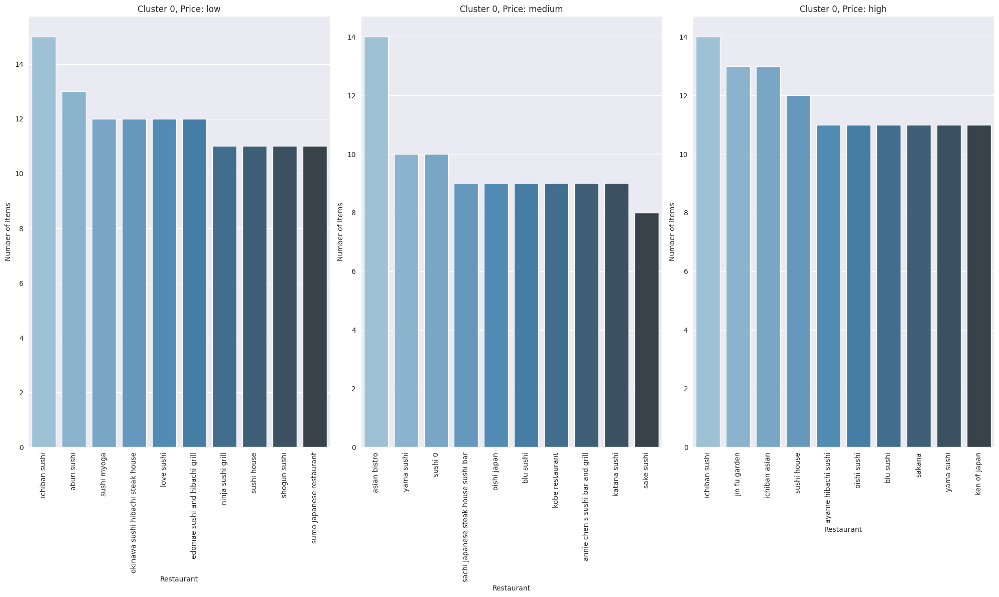

In [ ]:
plot_top10_restaurants_in_price_category_for_cluster(kmeans_df,0)

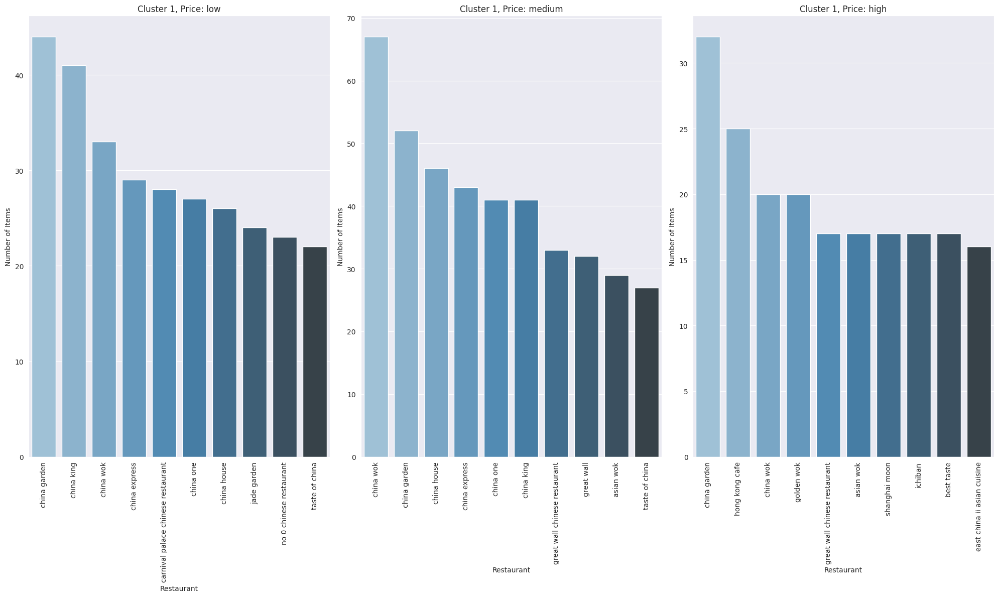

In [ ]:
plot_top10_restaurants_in_price_category_for_cluster(kmeans_df,1)

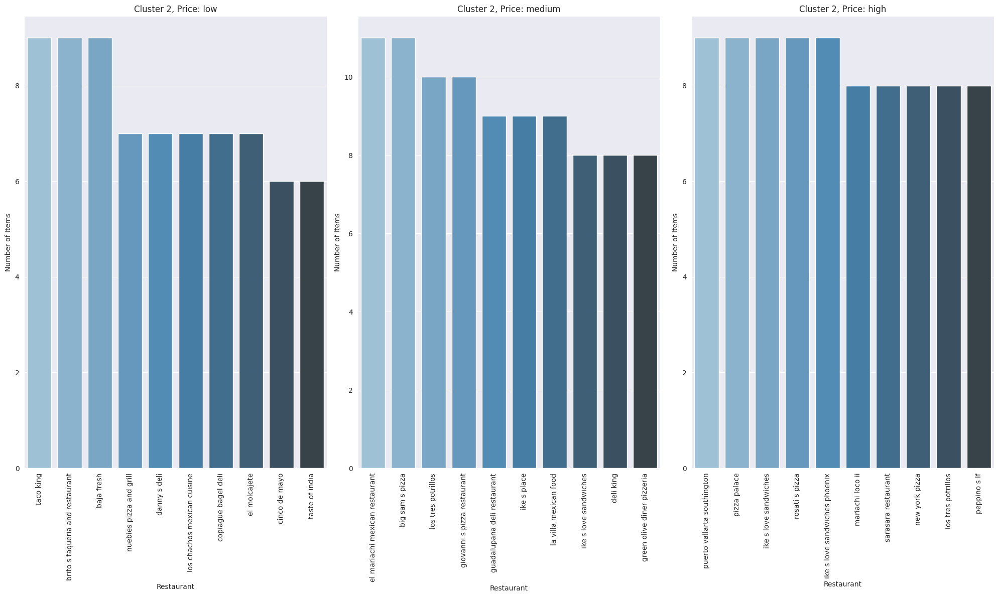

In [ ]:
plot_top10_restaurants_in_price_category_for_cluster(kmeans_df,2)

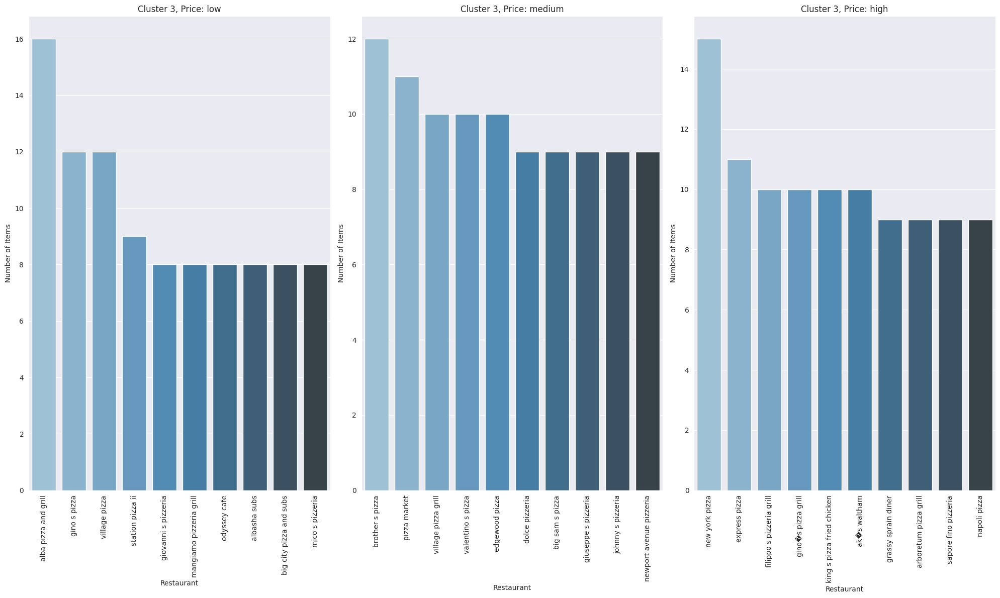

In [ ]:
plot_top10_restaurants_in_price_category_for_cluster(kmeans_df,3)

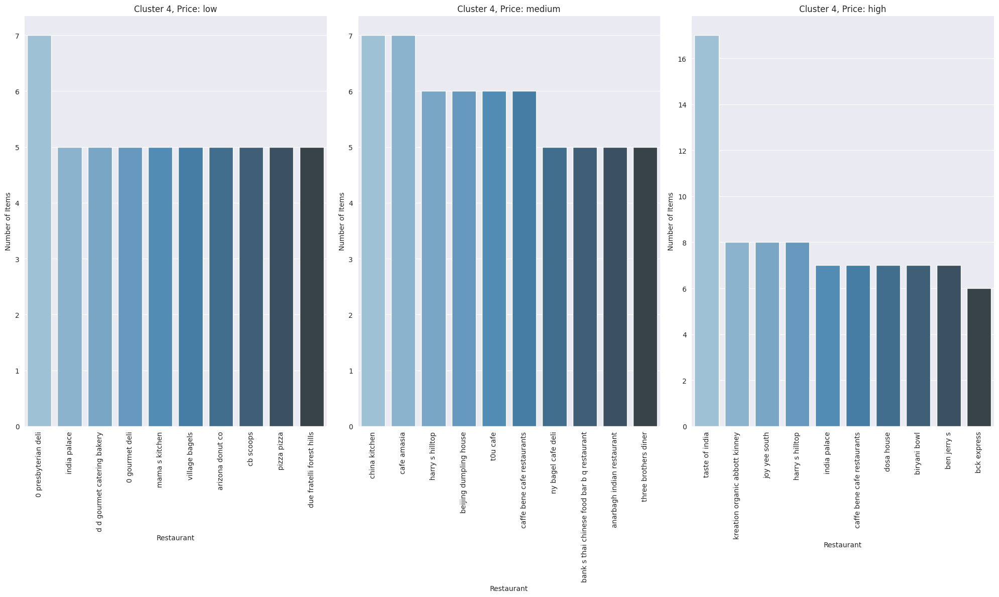

In [ ]:
plot_top10_restaurants_in_price_category_for_cluster(kmeans_df,4)

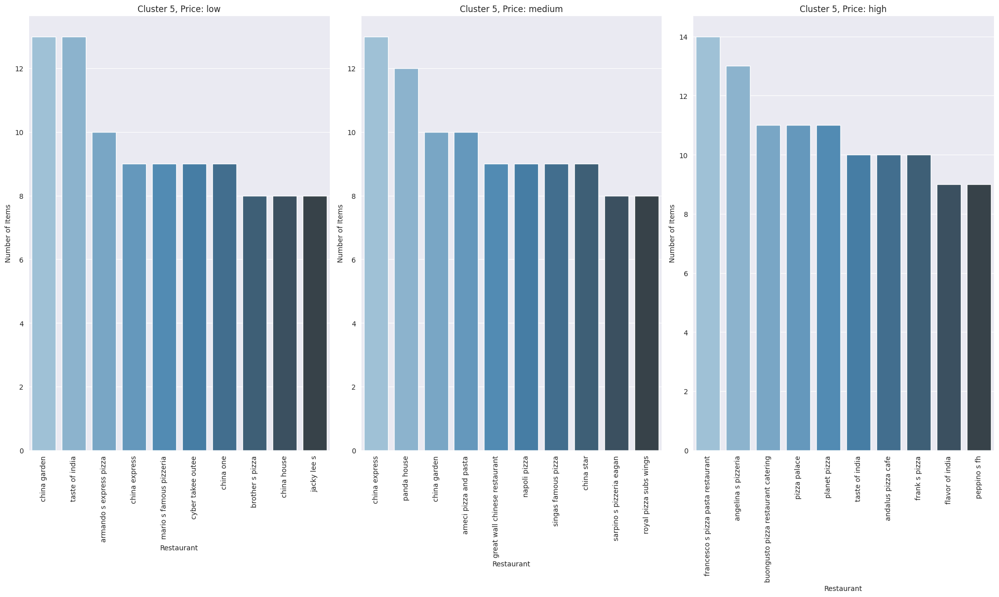

In [ ]:
plot_top10_restaurants_in_price_category_for_cluster(kmeans_df,5)